<a href="https://colab.research.google.com/github/redwanJemal/deeplearning/blob/main/gans_image_generation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Deep Convolution Adversarial Networks**

Generative adversarial networks (GANs) are algorithmic architectures that use two neural networks, pitting one against the other (thus the “adversarial”) in order to generate new, synthetic instances of data that can pass for real data. They are used widely in image generation, video generation and voice generation.

GANs are made up of two components -

1. **Generator - generates new data instances**

2. **Discriminator - tries to distinguish the generated or fake data from the real dataset.**

Discriminative algorithms try to classify input data; that is, given the features of an instance of data, they predict a label or category to which that data belongs. So discriminative algorithms map features to labels. They are concerned solely with that correlation.One the other way,loosely speaking,generative algorithms do the opposite. Instead of predicting a label given certain features, they attempt to predict features given a certain label.

While training they both start together from scratch and the generator learn to shape the random distribition through the training epochs.

![download%20%282%29.png](attachment:download%20%282%29.png)

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


# **LOSS FUNCTION of simple GAN**

In the paper that introduced GANs(link below in the reference), the generator tries to minimize the following function while the discriminator tries to maximize it:

In this function:

D(x) is the discriminator's estimate of the probability that real data instance x is real.

Ex is the expected value over all real data instances.

G(z) is the generator's output when given noise z.

D(G(z)) is the discriminator's estimate of the probability that a fake instance is real.

Ez is the expected value over all random inputs to the generator (in effect, the expected value over all generated fake instances G(z)).

The generator can't directly affect the log(D(x)) term in the function, so, for the generator, minimizing the loss is equivalent to minimizing log(1 - D(G(z))).

# **Loadind and Preprocessing data**

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import os
from keras import preprocessing
from keras.models import Sequential
from keras.layers import Conv2D,Dropout,Dense,Flatten,Conv2DTranspose,BatchNormalization,LeakyReLU,Reshape
import tensorflow as tf


Using TensorFlow backend.


In [ ]:
import os
cwd = os.getcwd()
os.chdir(cwd)
print(os.listdir("../input"))

['celeba-dataset']


In [ ]:
path_celeb = []
train_path_celeb = "/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/"
for path in os.listdir(train_path_celeb):
    if '.jpg' in path:
        path_celeb.append(os.path.join(train_path_celeb, path))

In [ ]:
new_path=path_celeb[0:50000]


In [ ]:
len(new_path)

50000

In [ ]:
crop = (30, 55, 150, 175) #croping size for the image so that only the face at centre is obtained
images = [np.array((Image.open(path).crop(crop)).resize((64,64))) for path in new_path]

for i in range(len(images)):
    images[i] = ((images[i] - images[i].min())/(255 - images[i].min()))
    #images[i] = images[i]*2-1  #uncomment this if activation is tanh for generator last layer
    
images = np.array(images) 

In [ ]:
train_data=images

In [ ]:
print(path_celeb)

In [ ]:
len(path_celeb)

202599

In [ ]:
print(train_data.shape)

(50000, 64, 64, 3)


# **Data Visualization**

<Figure size 720x720 with 0 Axes>

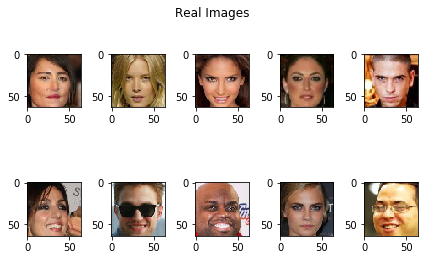

In [ ]:
plt.figure(figsize=(10,10))
fig,ax=plt.subplots(2,5)
fig.suptitle("Real Images")
idx=800

for i in range(2):
    for j in range(5):
            ax[i,j].imshow(train_data[idx].reshape(64,64,3))
            #ax[i,j].set_title("Real Image")
            
            idx+=600
            
plt.tight_layout()
plt.show()

**Note**  -- the image pixels are normalized dividing each pixel by 255 and then modified to bring within (-1,1) range by multiplying with 2 and substracting 1 since the last layer activation of generator is tanh whose range limits (-1,1)

In [ ]:
X_train = train_data

# **Architecture of the Model**

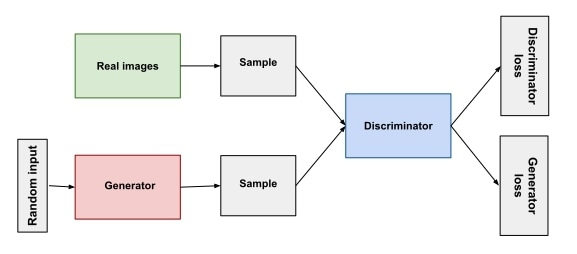



# **Generator**

In [ ]:
noise_shape = 100

In [ ]:
generator=Sequential()
generator.add(Dense(4*4*512,input_shape=[noise_shape]))
generator.add(Reshape([4,4,512]))
generator.add(Conv2DTranspose(256, kernel_size=4, strides=2, padding="same"))
generator.add(LeakyReLU(alpha=0.2))
generator.add(BatchNormalization())
generator.add(Conv2DTranspose(128, kernel_size=4, strides=2, padding="same"))
generator.add(LeakyReLU(alpha=0.2))
generator.add(BatchNormalization())
generator.add(Conv2DTranspose(64, kernel_size=4, strides=2, padding="same"))
generator.add(LeakyReLU(alpha=0.2))
generator.add(BatchNormalization())
generator.add(Conv2DTranspose(3, kernel_size=4, strides=2, padding="same",
                                 activation='sigmoid'))

the last layer for generator  have sigmoid activation in this version since I was trying between sigmoid and tanh to see which outputs better results. I found sigmoid activated model having better clarity in this case, however I have tried tanh activated generator too so if anyone want to refer to that can look at version 6/7 of this kernel where I use tanh. In case of using tanh the input pixels should be normalised between (-1,1) unlike sigmoid where it has been normalised between (0,1) .


In [ ]:
generator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 8192)              827392    
_________________________________________________________________
reshape_1 (Reshape)          (None, 4, 4, 512)         0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 8, 8, 256)         2097408   
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 8, 8, 256)         0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 8, 8, 256)         1024      
_________________________________________________________________
conv2d_transpose_2 (Conv2DTr (None, 16, 16, 128)       524416    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 16, 16, 128)      

# **Discriminator**

In [ ]:
discriminator=Sequential()
discriminator.add(Conv2D(32, kernel_size=4, strides=2, padding="same",input_shape=[64,64, 3]))
discriminator.add(Conv2D(64, kernel_size=4, strides=2, padding="same"))
discriminator.add(LeakyReLU(0.2))
discriminator.add(BatchNormalization())
discriminator.add(Conv2D(128, kernel_size=4, strides=2, padding="same"))
discriminator.add(LeakyReLU(0.2))
discriminator.add(BatchNormalization())
discriminator.add(Conv2D(256, kernel_size=4, strides=2, padding="same"))
discriminator.add(LeakyReLU(0.2))
discriminator.add(Flatten())
discriminator.add(Dropout(0.5))
discriminator.add(Dense(1,activation='sigmoid'))

In [ ]:
discriminator.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 32, 32, 32)        1568      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 16, 16, 64)        32832     
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 16, 16, 64)        0         
_________________________________________________________________
batch_normalization_4 (Batch (None, 16, 16, 64)        256       
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 8, 8, 128)         131200    
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
batch_normalization_5 (Batch (None, 8, 8, 128)        

# **DCGAN (combined model)**

In [ ]:
GAN =Sequential([generator,discriminator])

In [ ]:
discriminator.compile(optimizer='adam',loss='binary_crossentropy')
discriminator.trainable = False

In [ ]:
GAN.compile(optimizer='adam',loss='binary_crossentropy')

In [ ]:
GAN.layers

In [ ]:
GAN.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_1 (Sequential)    (None, 64, 64, 3)         3585219   
_________________________________________________________________
sequential_2 (Sequential)    (None, 1)                 695009    
Total params: 4,280,228
Trainable params: 3,584,323
Non-trainable params: 695,905
_________________________________________________________________


# **Training**

In [ ]:
epochs = 300  #set epoch according to your training dataset size,i had chosen 50k images hence epochs are high as 300...
batch_size = 128

In [ ]:
D_loss=[] #list to collect loss for the discriminator model
G_loss=[] #list to collect loss for generator model

Currently on Epoch 1
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390


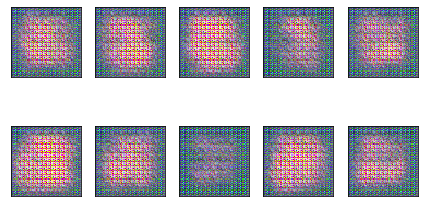

Epoch: 1,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 2
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 2,  Loss: D_real = 0.181, D_fake = 0.063,  G = 15.118
Currently on Epoch 3
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 3,  Loss: D_real = 0.008, D_fake = 0.029,  G = 12.555
Currently on Epoch 4
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 4,  Loss: D_real = 0.015, D_fake = 0.001,  G = 11.753
Currently on Epoch 5
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 5,  Loss: D_real = 0.021, D_fake = 0.001,  G = 13.898
Currently on

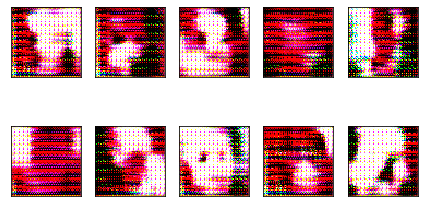

Epoch: 6,  Loss: D_real = 1.293, D_fake = 0.005,  G = 7.659
Currently on Epoch 7
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 7,  Loss: D_real = 0.024, D_fake = 0.046,  G = 11.877
Currently on Epoch 8
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 8,  Loss: D_real = 0.000, D_fake = 0.047,  G = 8.603
Currently on Epoch 9
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 9,  Loss: D_real = 0.000, D_fake = 0.014,  G = 9.464
Currently on Epoch 10
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 10,  Loss: D_real = 0.000, D_fake = 0.000,  G = 20.208
Currently on

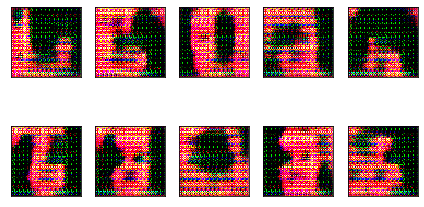

Epoch: 11,  Loss: D_real = 0.000, D_fake = 0.002,  G = 14.231
Currently on Epoch 12
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 12,  Loss: D_real = 0.017, D_fake = 0.071,  G = 8.364
Currently on Epoch 13
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 13,  Loss: D_real = 0.033, D_fake = 0.001,  G = 17.899
Currently on Epoch 14
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 14,  Loss: D_real = 0.033, D_fake = 0.007,  G = 17.458
Currently on Epoch 15
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 15,  Loss: D_real = 0.005, D_fake = 0.000,  G = 25.193
Cur

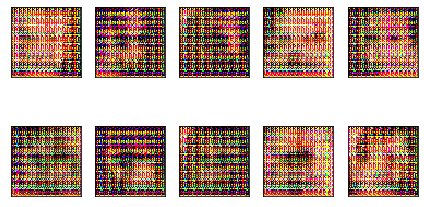

Epoch: 16,  Loss: D_real = 0.000, D_fake = 0.000,  G = 13.782
Currently on Epoch 17
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 17,  Loss: D_real = 0.000, D_fake = 0.000,  G = 36.209
Currently on Epoch 18
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 18,  Loss: D_real = 0.161, D_fake = 0.000,  G = 40.008
Currently on Epoch 19
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 19,  Loss: D_real = 0.000, D_fake = 0.000,  G = 13.236
Currently on Epoch 20
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 20,  Loss: D_real = 0.004, D_fake = 0.095,  G = 36.275
Cu

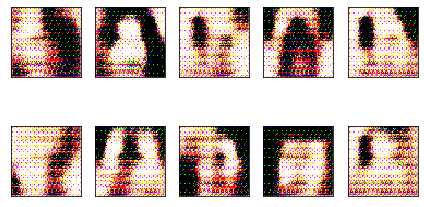

Epoch: 21,  Loss: D_real = 0.000, D_fake = 0.001,  G = 13.902
Currently on Epoch 22
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 22,  Loss: D_real = 0.022, D_fake = 0.000,  G = 30.557
Currently on Epoch 23
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 23,  Loss: D_real = 0.135, D_fake = 0.030,  G = 8.760
Currently on Epoch 24
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 24,  Loss: D_real = 0.023, D_fake = 0.006,  G = 8.288
Currently on Epoch 25
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 25,  Loss: D_real = 0.018, D_fake = 0.004,  G = 6.933
Curre

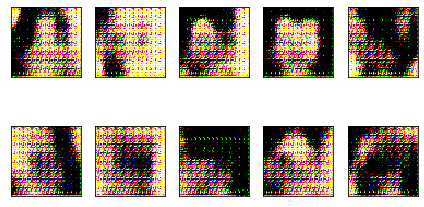

Epoch: 26,  Loss: D_real = 0.000, D_fake = 0.000,  G = 33.150
Currently on Epoch 27
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 27,  Loss: D_real = 0.146, D_fake = 0.022,  G = 17.378
Currently on Epoch 28
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 28,  Loss: D_real = 0.000, D_fake = 0.000,  G = 29.417
Currently on Epoch 29
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 29,  Loss: D_real = 0.000, D_fake = 0.000,  G = 43.669
Currently on Epoch 30
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 30,  Loss: D_real = 0.000, D_fake = 0.000,  G = 144.337
C

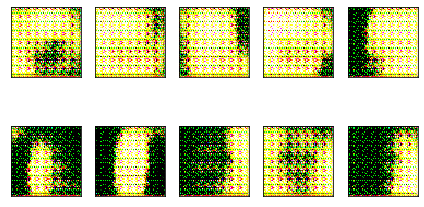

Epoch: 31,  Loss: D_real = 0.000, D_fake = 0.000,  G = 25.249
Currently on Epoch 32
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 32,  Loss: D_real = 0.000, D_fake = 0.000,  G = 49.953
Currently on Epoch 33
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 33,  Loss: D_real = 0.000, D_fake = 0.025,  G = 15.298
Currently on Epoch 34
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 34,  Loss: D_real = 0.049, D_fake = 0.021,  G = 14.157
Currently on Epoch 35
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 35,  Loss: D_real = 0.013, D_fake = 0.000,  G = 20.277
Cu

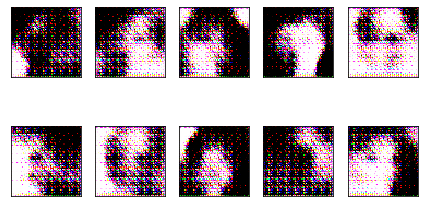

Epoch: 36,  Loss: D_real = 0.001, D_fake = 0.015,  G = 9.928
Currently on Epoch 37
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 37,  Loss: D_real = 0.001, D_fake = 0.011,  G = 9.111
Currently on Epoch 38
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 38,  Loss: D_real = 0.001, D_fake = 0.001,  G = 19.228
Currently on Epoch 39
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 39,  Loss: D_real = 0.000, D_fake = 0.001,  G = 19.338
Currently on Epoch 40
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 40,  Loss: D_real = 0.034, D_fake = 0.000,  G = 20.261
Curr

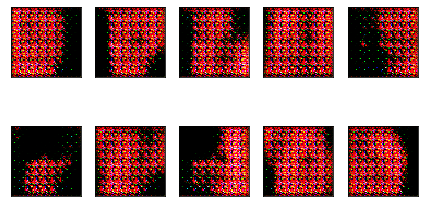

Epoch: 41,  Loss: D_real = 0.002, D_fake = 0.000,  G = 18.888
Currently on Epoch 42
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 42,  Loss: D_real = 0.003, D_fake = 0.023,  G = 14.085
Currently on Epoch 43
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 43,  Loss: D_real = 0.000, D_fake = 0.001,  G = 12.373
Currently on Epoch 44
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 44,  Loss: D_real = 0.139, D_fake = 0.003,  G = 16.610
Currently on Epoch 45
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 45,  Loss: D_real = 0.001, D_fake = 0.003,  G = 10.866
Cu

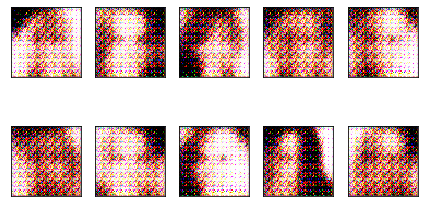

Epoch: 46,  Loss: D_real = 0.002, D_fake = 0.103,  G = 11.445
Currently on Epoch 47
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 47,  Loss: D_real = 0.000, D_fake = 0.008,  G = 8.726
Currently on Epoch 48
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 48,  Loss: D_real = 0.045, D_fake = 0.002,  G = 5.752
Currently on Epoch 49
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 49,  Loss: D_real = 0.011, D_fake = 0.002,  G = 5.412
Currently on Epoch 50
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 50,  Loss: D_real = 0.018, D_fake = 0.018,  G = 11.879
Curre

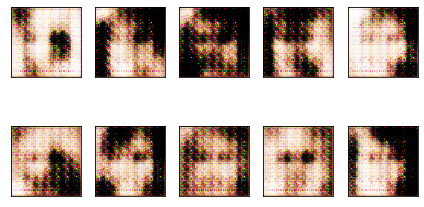

Epoch: 51,  Loss: D_real = 0.005, D_fake = 0.030,  G = 9.888
Currently on Epoch 52
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 52,  Loss: D_real = 0.002, D_fake = 0.011,  G = 11.155
Currently on Epoch 53
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 53,  Loss: D_real = 0.032, D_fake = 0.023,  G = 10.775
Currently on Epoch 54
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 54,  Loss: D_real = 0.189, D_fake = 0.025,  G = 12.888
Currently on Epoch 55
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 55,  Loss: D_real = 0.427, D_fake = 0.230,  G = 6.204
Curr

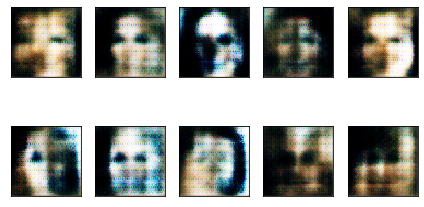

Epoch: 56,  Loss: D_real = 0.225, D_fake = 0.014,  G = 6.784
Currently on Epoch 57
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 57,  Loss: D_real = 0.140, D_fake = 0.043,  G = 12.804
Currently on Epoch 58
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 58,  Loss: D_real = 0.061, D_fake = 0.025,  G = 8.218
Currently on Epoch 59
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 59,  Loss: D_real = 0.049, D_fake = 0.029,  G = 10.198
Currently on Epoch 60
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 60,  Loss: D_real = 0.020, D_fake = 0.048,  G = 8.065
Curre

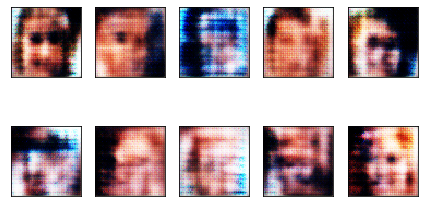

Epoch: 61,  Loss: D_real = 0.292, D_fake = 0.004,  G = 8.715
Currently on Epoch 62
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 62,  Loss: D_real = 0.005, D_fake = 0.055,  G = 8.620
Currently on Epoch 63
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 63,  Loss: D_real = 0.284, D_fake = 0.060,  G = 8.655
Currently on Epoch 64
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 64,  Loss: D_real = 0.011, D_fake = 0.103,  G = 7.206
Currently on Epoch 65
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 65,  Loss: D_real = 0.158, D_fake = 0.012,  G = 11.613
Curren

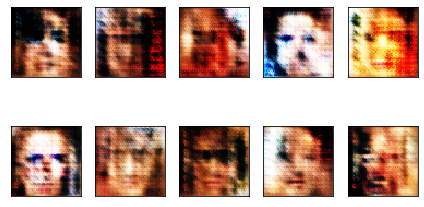

Epoch: 66,  Loss: D_real = 0.022, D_fake = 0.026,  G = 11.973
Currently on Epoch 67
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 67,  Loss: D_real = 0.169, D_fake = 0.207,  G = 6.770
Currently on Epoch 68
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 68,  Loss: D_real = 0.078, D_fake = 0.189,  G = 5.898
Currently on Epoch 69
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 69,  Loss: D_real = 0.140, D_fake = 0.034,  G = 8.448
Currently on Epoch 70
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 70,  Loss: D_real = 0.070, D_fake = 0.012,  G = 9.420
Curren

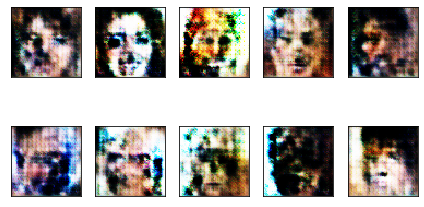

Epoch: 71,  Loss: D_real = 0.001, D_fake = 0.308,  G = 8.772
Currently on Epoch 72
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 72,  Loss: D_real = 0.061, D_fake = 0.051,  G = 7.731
Currently on Epoch 73
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 73,  Loss: D_real = 0.023, D_fake = 0.000,  G = 14.187
Currently on Epoch 74
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 74,  Loss: D_real = 0.134, D_fake = 0.007,  G = 13.298
Currently on Epoch 75
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 75,  Loss: D_real = 0.048, D_fake = 0.112,  G = 9.081
Curre

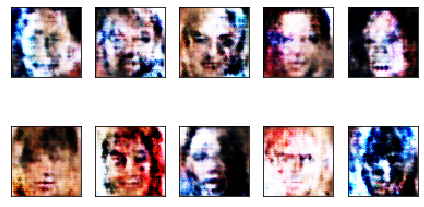

Epoch: 76,  Loss: D_real = 0.322, D_fake = 0.010,  G = 10.292
Currently on Epoch 77
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 77,  Loss: D_real = 0.140, D_fake = 0.037,  G = 9.897
Currently on Epoch 78
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 78,  Loss: D_real = 0.259, D_fake = 0.037,  G = 5.458
Currently on Epoch 79
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 79,  Loss: D_real = 0.088, D_fake = 0.065,  G = 6.321
Currently on Epoch 80
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 80,  Loss: D_real = 0.015, D_fake = 0.042,  G = 9.025
Curren

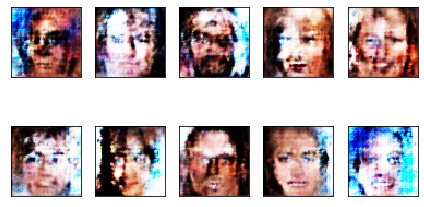

Epoch: 81,  Loss: D_real = 0.019, D_fake = 0.012,  G = 9.189
Currently on Epoch 82
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 82,  Loss: D_real = 0.019, D_fake = 0.036,  G = 11.497
Currently on Epoch 83
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 83,  Loss: D_real = 0.007, D_fake = 0.071,  G = 8.614
Currently on Epoch 84
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 84,  Loss: D_real = 0.151, D_fake = 0.015,  G = 10.009
Currently on Epoch 85
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 85,  Loss: D_real = 0.000, D_fake = 0.254,  G = 5.825
Curre

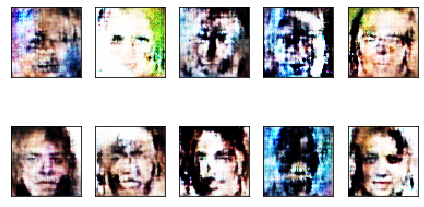

Epoch: 86,  Loss: D_real = 0.017, D_fake = 0.013,  G = 8.093
Currently on Epoch 87
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 87,  Loss: D_real = 0.042, D_fake = 0.036,  G = 10.362
Currently on Epoch 88
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 88,  Loss: D_real = 0.022, D_fake = 0.061,  G = 9.344
Currently on Epoch 89
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 89,  Loss: D_real = 0.073, D_fake = 0.063,  G = 9.855
Currently on Epoch 90
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 90,  Loss: D_real = 0.004, D_fake = 0.131,  G = 8.815
Curren

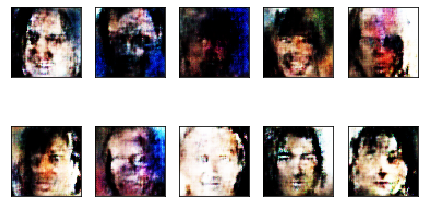

Epoch: 91,  Loss: D_real = 0.000, D_fake = 0.168,  G = 7.107
Currently on Epoch 92
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 92,  Loss: D_real = 0.048, D_fake = 0.060,  G = 6.851
Currently on Epoch 93
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 93,  Loss: D_real = 0.052, D_fake = 0.036,  G = 8.450
Currently on Epoch 94
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 94,  Loss: D_real = 0.033, D_fake = 0.104,  G = 10.702
Currently on Epoch 95
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 95,  Loss: D_real = 0.020, D_fake = 0.012,  G = 9.575
Curren

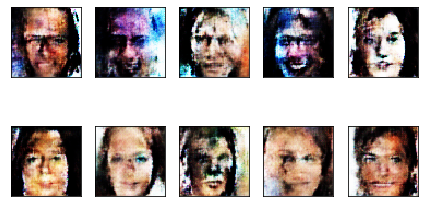

Epoch: 96,  Loss: D_real = 0.067, D_fake = 0.153,  G = 6.975
Currently on Epoch 97
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 97,  Loss: D_real = 0.002, D_fake = 0.620,  G = 6.435
Currently on Epoch 98
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 98,  Loss: D_real = 0.006, D_fake = 0.051,  G = 8.405
Currently on Epoch 99
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 99,  Loss: D_real = 0.006, D_fake = 0.222,  G = 8.359
Currently on Epoch 100
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 100,  Loss: D_real = 0.038, D_fake = 0.011,  G = 12.363
Curr

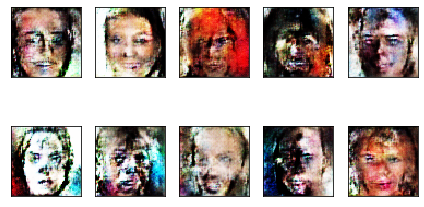

Epoch: 101,  Loss: D_real = 0.006, D_fake = 0.062,  G = 8.764
Currently on Epoch 102
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 102,  Loss: D_real = 0.271, D_fake = 0.071,  G = 9.505
Currently on Epoch 103
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 103,  Loss: D_real = 0.489, D_fake = 0.061,  G = 6.680
Currently on Epoch 104
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 104,  Loss: D_real = 0.104, D_fake = 0.079,  G = 9.275
Currently on Epoch 105
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 105,  Loss: D_real = 0.012, D_fake = 0.005,  G = 13.0

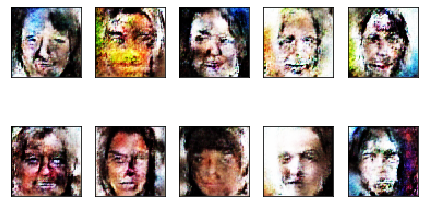

Epoch: 106,  Loss: D_real = 0.025, D_fake = 0.009,  G = 10.258
Currently on Epoch 107
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 107,  Loss: D_real = 0.009, D_fake = 0.004,  G = 14.209
Currently on Epoch 108
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 108,  Loss: D_real = 0.030, D_fake = 0.067,  G = 8.000
Currently on Epoch 109
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 109,  Loss: D_real = 0.086, D_fake = 0.151,  G = 7.019
Currently on Epoch 110
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 110,  Loss: D_real = 0.049, D_fake = 0.083,  G = 10

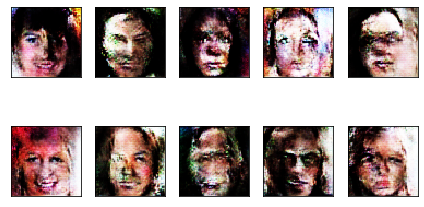

Epoch: 111,  Loss: D_real = 0.128, D_fake = 0.002,  G = 10.636
Currently on Epoch 112
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 112,  Loss: D_real = 0.014, D_fake = 0.022,  G = 9.252
Currently on Epoch 113
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 113,  Loss: D_real = 0.068, D_fake = 0.174,  G = 7.850
Currently on Epoch 114
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 114,  Loss: D_real = 0.092, D_fake = 0.142,  G = 8.073
Currently on Epoch 115
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 115,  Loss: D_real = 0.298, D_fake = 0.130,  G = 7.1

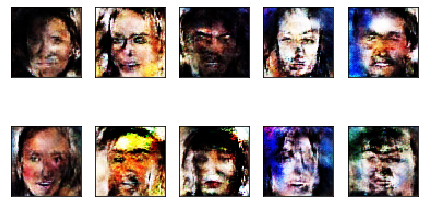

Epoch: 116,  Loss: D_real = 0.067, D_fake = 0.041,  G = 8.944
Currently on Epoch 117
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 117,  Loss: D_real = 0.123, D_fake = 0.169,  G = 8.746
Currently on Epoch 118
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 118,  Loss: D_real = 10.768, D_fake = 0.000,  G = 9.077
Currently on Epoch 119
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 119,  Loss: D_real = 0.466, D_fake = 0.394,  G = 7.842
Currently on Epoch 120
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 120,  Loss: D_real = 0.020, D_fake = 0.003,  G = 11.

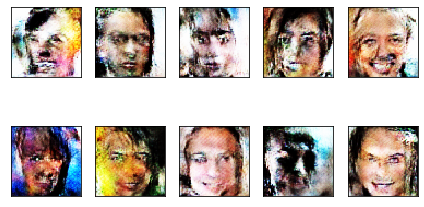

Epoch: 121,  Loss: D_real = 0.002, D_fake = 0.003,  G = 12.619
Currently on Epoch 122
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 122,  Loss: D_real = 0.000, D_fake = 0.013,  G = 10.512
Currently on Epoch 123
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 123,  Loss: D_real = 0.029, D_fake = 0.048,  G = 9.108
Currently on Epoch 124
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 124,  Loss: D_real = 0.011, D_fake = 0.023,  G = 9.613
Currently on Epoch 125
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 125,  Loss: D_real = 0.013, D_fake = 0.024,  G = 8.

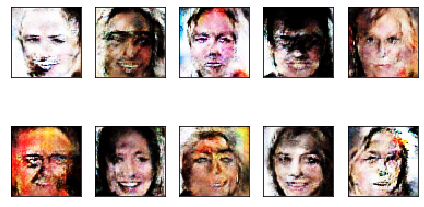

Epoch: 126,  Loss: D_real = 0.117, D_fake = 0.008,  G = 12.694
Currently on Epoch 127
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 127,  Loss: D_real = 0.043, D_fake = 0.000,  G = 16.524
Currently on Epoch 128
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 128,  Loss: D_real = 0.061, D_fake = 0.117,  G = 11.438
Currently on Epoch 129
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 129,  Loss: D_real = 0.017, D_fake = 0.018,  G = 9.459
Currently on Epoch 130
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 130,  Loss: D_real = 0.072, D_fake = 0.001,  G = 1

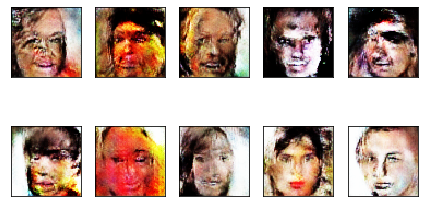

Epoch: 131,  Loss: D_real = 0.204, D_fake = 0.010,  G = 9.897
Currently on Epoch 132
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 132,  Loss: D_real = 0.114, D_fake = 0.001,  G = 19.915
Currently on Epoch 133
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 133,  Loss: D_real = 0.000, D_fake = 0.006,  G = 13.540
Currently on Epoch 134
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 134,  Loss: D_real = 0.052, D_fake = 0.009,  G = 9.408
Currently on Epoch 135
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 135,  Loss: D_real = 0.006, D_fake = 0.004,  G = 12

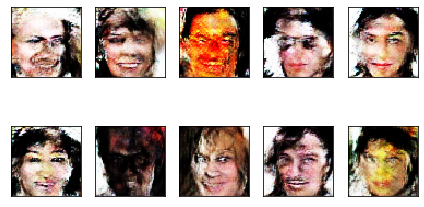

Epoch: 136,  Loss: D_real = 0.024, D_fake = 0.109,  G = 7.496
Currently on Epoch 137
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 137,  Loss: D_real = 0.020, D_fake = 0.005,  G = 9.002
Currently on Epoch 138
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 138,  Loss: D_real = 0.000, D_fake = 0.003,  G = 10.019
Currently on Epoch 139
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 139,  Loss: D_real = 0.071, D_fake = 0.065,  G = 8.103
Currently on Epoch 140
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 140,  Loss: D_real = 0.027, D_fake = 0.014,  G = 9.9

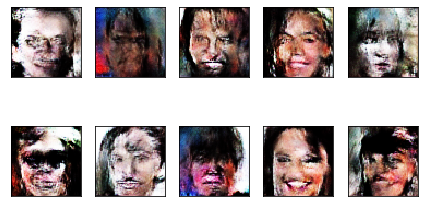

Epoch: 141,  Loss: D_real = 0.024, D_fake = 0.021,  G = 8.844
Currently on Epoch 142
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 142,  Loss: D_real = 0.066, D_fake = 0.024,  G = 11.027
Currently on Epoch 143
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 143,  Loss: D_real = 0.013, D_fake = 0.005,  G = 9.140
Currently on Epoch 144
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 144,  Loss: D_real = 0.013, D_fake = 0.015,  G = 9.845
Currently on Epoch 145
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 145,  Loss: D_real = 0.009, D_fake = 0.067,  G = 11.

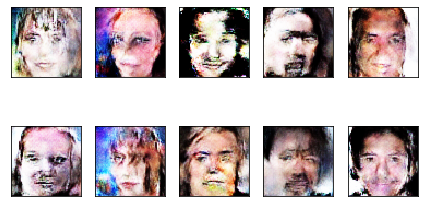

Epoch: 146,  Loss: D_real = 0.107, D_fake = 0.008,  G = 8.855
Currently on Epoch 147
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 147,  Loss: D_real = 0.019, D_fake = 0.099,  G = 9.917
Currently on Epoch 148
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 148,  Loss: D_real = 0.005, D_fake = 0.058,  G = 8.723
Currently on Epoch 149
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 149,  Loss: D_real = 0.042, D_fake = 0.060,  G = 8.108
Currently on Epoch 150
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 150,  Loss: D_real = 0.040, D_fake = 0.001,  G = 13.2

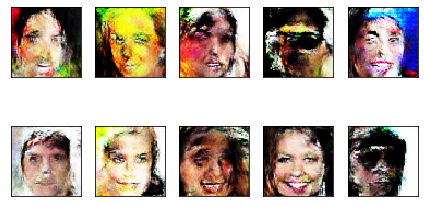

Epoch: 151,  Loss: D_real = 0.091, D_fake = 0.005,  G = 10.405
Currently on Epoch 152
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 152,  Loss: D_real = 0.007, D_fake = 0.036,  G = 9.994
Currently on Epoch 153
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 153,  Loss: D_real = 0.044, D_fake = 0.023,  G = 7.779
Currently on Epoch 154
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 154,  Loss: D_real = 0.001, D_fake = 0.068,  G = 9.721
Currently on Epoch 155
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 155,  Loss: D_real = 0.007, D_fake = 0.081,  G = 7.0

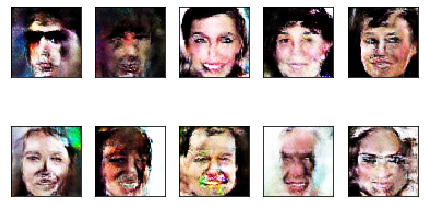

Epoch: 156,  Loss: D_real = 0.161, D_fake = 0.005,  G = 12.332
Currently on Epoch 157
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 157,  Loss: D_real = 0.000, D_fake = 0.113,  G = 8.172
Currently on Epoch 158
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 158,  Loss: D_real = 0.051, D_fake = 0.011,  G = 9.841
Currently on Epoch 159
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 159,  Loss: D_real = 0.059, D_fake = 0.032,  G = 7.835
Currently on Epoch 160
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 160,  Loss: D_real = 0.001, D_fake = 0.090,  G = 10.

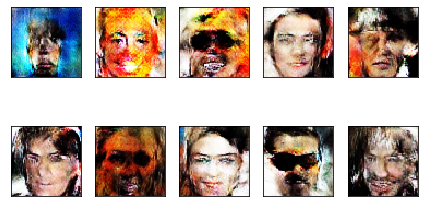

Epoch: 161,  Loss: D_real = 0.004, D_fake = 0.009,  G = 10.443
Currently on Epoch 162
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 162,  Loss: D_real = 0.030, D_fake = 0.045,  G = 8.650
Currently on Epoch 163
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 163,  Loss: D_real = 0.004, D_fake = 0.008,  G = 11.021
Currently on Epoch 164
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 164,  Loss: D_real = 0.001, D_fake = 0.044,  G = 7.969
Currently on Epoch 165
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 165,  Loss: D_real = 0.004, D_fake = 0.054,  G = 7.

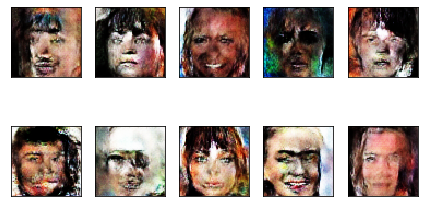

Epoch: 166,  Loss: D_real = 0.086, D_fake = 0.011,  G = 9.771
Currently on Epoch 167
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 167,  Loss: D_real = 0.064, D_fake = 0.003,  G = 8.147
Currently on Epoch 168
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 168,  Loss: D_real = 0.025, D_fake = 0.041,  G = 9.765
Currently on Epoch 169
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 169,  Loss: D_real = 0.009, D_fake = 0.015,  G = 11.685
Currently on Epoch 170
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 170,  Loss: D_real = 0.090, D_fake = 0.008,  G = 8.1

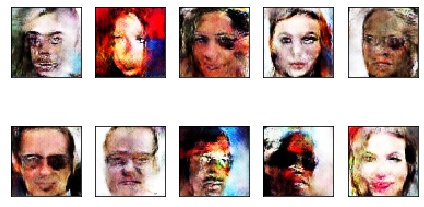

Epoch: 171,  Loss: D_real = 0.014, D_fake = 0.017,  G = 11.869
Currently on Epoch 172
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 172,  Loss: D_real = 0.014, D_fake = 0.007,  G = 8.387
Currently on Epoch 173
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 173,  Loss: D_real = 0.006, D_fake = 0.001,  G = 14.511
Currently on Epoch 174
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 174,  Loss: D_real = 0.020, D_fake = 0.046,  G = 9.132
Currently on Epoch 175
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 175,  Loss: D_real = 0.002, D_fake = 0.009,  G = 9.

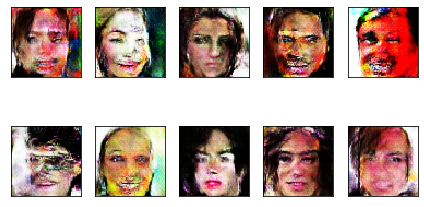

Epoch: 176,  Loss: D_real = 0.034, D_fake = 0.072,  G = 9.719
Currently on Epoch 177
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 177,  Loss: D_real = 0.037, D_fake = 0.044,  G = 7.913
Currently on Epoch 178
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 178,  Loss: D_real = 0.048, D_fake = 0.008,  G = 8.469
Currently on Epoch 179
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 179,  Loss: D_real = 0.005, D_fake = 0.013,  G = 13.056
Currently on Epoch 180
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 180,  Loss: D_real = 0.002, D_fake = 0.022,  G = 8.9

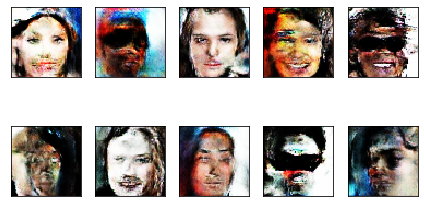

Epoch: 181,  Loss: D_real = 0.034, D_fake = 0.019,  G = 8.978
Currently on Epoch 182
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 182,  Loss: D_real = 0.031, D_fake = 0.011,  G = 8.995
Currently on Epoch 183
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 183,  Loss: D_real = 0.015, D_fake = 0.003,  G = 11.969
Currently on Epoch 184
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 184,  Loss: D_real = 0.060, D_fake = 0.148,  G = 5.493
Currently on Epoch 185
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 185,  Loss: D_real = 0.003, D_fake = 0.095,  G = 8.8

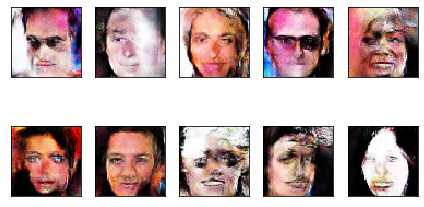

Epoch: 186,  Loss: D_real = 0.002, D_fake = 0.007,  G = 10.005
Currently on Epoch 187
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 187,  Loss: D_real = 0.021, D_fake = 0.007,  G = 11.033
Currently on Epoch 188
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 188,  Loss: D_real = 0.025, D_fake = 0.006,  G = 9.067
Currently on Epoch 189
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 189,  Loss: D_real = 0.481, D_fake = 0.068,  G = 10.917
Currently on Epoch 190
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 190,  Loss: D_real = 0.020, D_fake = 0.787,  G = 6

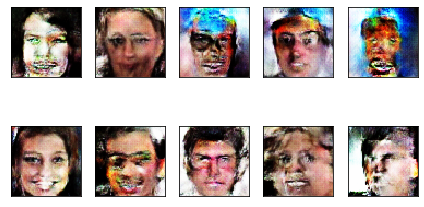

Epoch: 191,  Loss: D_real = 0.014, D_fake = 0.078,  G = 7.032
Currently on Epoch 192
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 192,  Loss: D_real = 0.033, D_fake = 0.019,  G = 9.296
Currently on Epoch 193
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 193,  Loss: D_real = 3.784, D_fake = 0.249,  G = 1.385
Currently on Epoch 194
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 194,  Loss: D_real = 0.033, D_fake = 0.045,  G = 9.070
Currently on Epoch 195
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 195,  Loss: D_real = 0.106, D_fake = 0.281,  G = 6.69

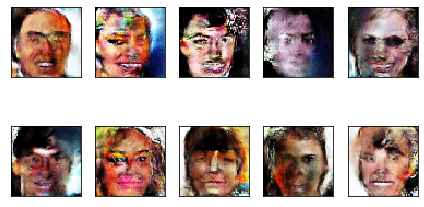

Epoch: 196,  Loss: D_real = 0.001, D_fake = 0.003,  G = 11.941
Currently on Epoch 197
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 197,  Loss: D_real = 0.053, D_fake = 0.033,  G = 9.057
Currently on Epoch 198
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 198,  Loss: D_real = 0.043, D_fake = 0.132,  G = 9.988
Currently on Epoch 199
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 199,  Loss: D_real = 0.028, D_fake = 0.006,  G = 9.550
Currently on Epoch 200
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 200,  Loss: D_real = 0.020, D_fake = 0.019,  G = 10.

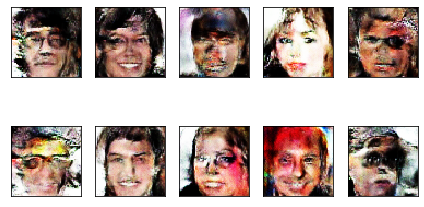

Epoch: 201,  Loss: D_real = 0.000, D_fake = 0.016,  G = 10.792
Currently on Epoch 202
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 202,  Loss: D_real = 0.001, D_fake = 0.074,  G = 7.791
Currently on Epoch 203
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 203,  Loss: D_real = 0.003, D_fake = 0.005,  G = 11.143
Currently on Epoch 204
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 204,  Loss: D_real = 0.053, D_fake = 0.001,  G = 11.707
Currently on Epoch 205
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 205,  Loss: D_real = 0.002, D_fake = 0.010,  G = 1

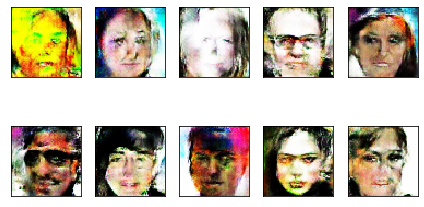

Epoch: 206,  Loss: D_real = 0.233, D_fake = 0.065,  G = 10.883
Currently on Epoch 207
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 207,  Loss: D_real = 0.018, D_fake = 0.170,  G = 8.328
Currently on Epoch 208
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 208,  Loss: D_real = 0.006, D_fake = 0.035,  G = 11.171
Currently on Epoch 209
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 209,  Loss: D_real = 0.057, D_fake = 0.031,  G = 9.929
Currently on Epoch 210
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 210,  Loss: D_real = 0.064, D_fake = 0.198,  G = 9.

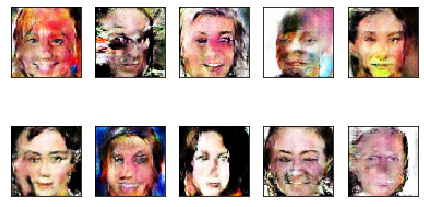

Epoch: 211,  Loss: D_real = 0.139, D_fake = 0.000,  G = 14.744
Currently on Epoch 212
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 212,  Loss: D_real = 0.008, D_fake = 0.003,  G = 11.485
Currently on Epoch 213
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 213,  Loss: D_real = 0.002, D_fake = 0.046,  G = 9.812
Currently on Epoch 214
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 214,  Loss: D_real = 0.041, D_fake = 0.011,  G = 8.224
Currently on Epoch 215
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 215,  Loss: D_real = 0.525, D_fake = 0.068,  G = 9.

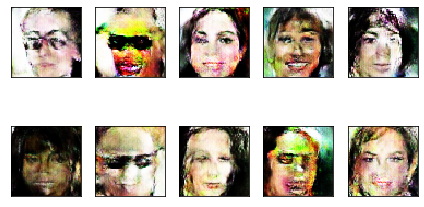

Epoch: 216,  Loss: D_real = 0.001, D_fake = 0.093,  G = 8.480
Currently on Epoch 217
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 217,  Loss: D_real = 0.024, D_fake = 0.001,  G = 14.280
Currently on Epoch 218
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 218,  Loss: D_real = 0.001, D_fake = 0.009,  G = 10.758
Currently on Epoch 219
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 219,  Loss: D_real = 0.000, D_fake = 0.016,  G = 8.876
Currently on Epoch 220
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 220,  Loss: D_real = 0.001, D_fake = 0.284,  G = 6.

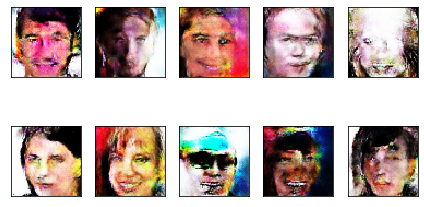

Epoch: 221,  Loss: D_real = 0.000, D_fake = 0.226,  G = 7.541
Currently on Epoch 222
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 222,  Loss: D_real = 0.002, D_fake = 0.001,  G = 11.926
Currently on Epoch 223
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 223,  Loss: D_real = 0.050, D_fake = 0.005,  G = 11.118
Currently on Epoch 224
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 224,  Loss: D_real = 0.195, D_fake = 0.030,  G = 17.289
Currently on Epoch 225
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 225,  Loss: D_real = 0.002, D_fake = 0.023,  G = 9

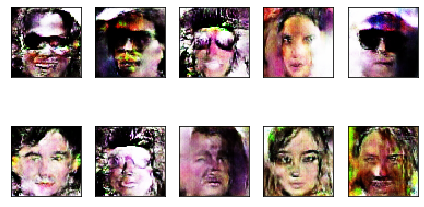

Epoch: 226,  Loss: D_real = 0.121, D_fake = 0.009,  G = 9.600
Currently on Epoch 227
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 227,  Loss: D_real = 0.001, D_fake = 0.018,  G = 10.321
Currently on Epoch 228
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 228,  Loss: D_real = 0.123, D_fake = 0.022,  G = 9.045
Currently on Epoch 229
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 229,  Loss: D_real = 0.001, D_fake = 0.003,  G = 13.177
Currently on Epoch 230
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 230,  Loss: D_real = 0.052, D_fake = 0.000,  G = 14

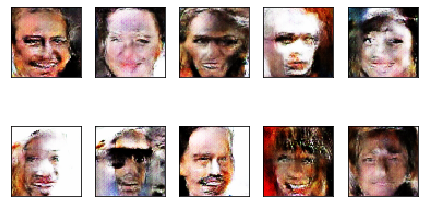

Epoch: 231,  Loss: D_real = 0.023, D_fake = 0.002,  G = 15.368
Currently on Epoch 232
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 232,  Loss: D_real = 0.000, D_fake = 0.086,  G = 9.776
Currently on Epoch 233
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 233,  Loss: D_real = 0.003, D_fake = 0.002,  G = 10.346
Currently on Epoch 234
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 234,  Loss: D_real = 0.053, D_fake = 0.039,  G = 10.842
Currently on Epoch 235
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 235,  Loss: D_real = 0.015, D_fake = 0.075,  G = 9

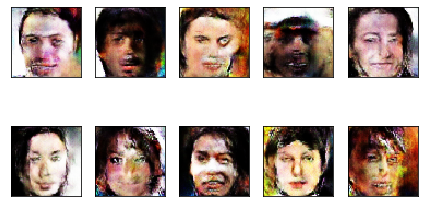

Epoch: 236,  Loss: D_real = 0.025, D_fake = 0.003,  G = 10.622
Currently on Epoch 237
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 237,  Loss: D_real = 0.018, D_fake = 0.004,  G = 12.694
Currently on Epoch 238
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 238,  Loss: D_real = 0.004, D_fake = 0.065,  G = 11.583
Currently on Epoch 239
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 239,  Loss: D_real = 0.067, D_fake = 0.001,  G = 11.820
Currently on Epoch 240
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 240,  Loss: D_real = 0.046, D_fake = 0.003,  G = 

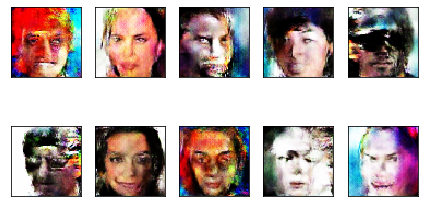

Epoch: 241,  Loss: D_real = 0.012, D_fake = 0.338,  G = 7.145
Currently on Epoch 242
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 242,  Loss: D_real = 0.000, D_fake = 0.139,  G = 9.505
Currently on Epoch 243
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 243,  Loss: D_real = 0.000, D_fake = 0.486,  G = 9.312
Currently on Epoch 244
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 244,  Loss: D_real = 0.018, D_fake = 0.008,  G = 10.059
Currently on Epoch 245
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 245,  Loss: D_real = 0.007, D_fake = 0.106,  G = 10.

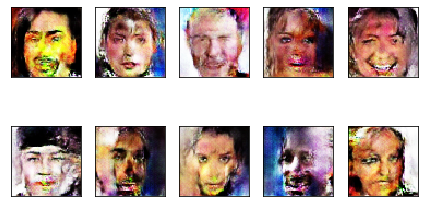

Epoch: 246,  Loss: D_real = 0.013, D_fake = 0.109,  G = 8.574
Currently on Epoch 247
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 247,  Loss: D_real = 0.045, D_fake = 0.042,  G = 10.498
Currently on Epoch 248
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 248,  Loss: D_real = 0.026, D_fake = 0.000,  G = 18.211
Currently on Epoch 249
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 249,  Loss: D_real = 0.012, D_fake = 0.006,  G = 11.645
Currently on Epoch 250
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 250,  Loss: D_real = 0.114, D_fake = 0.025,  G = 1

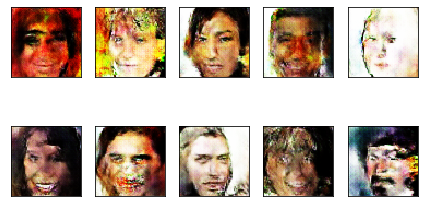

Epoch: 251,  Loss: D_real = 0.003, D_fake = 0.034,  G = 9.745
Currently on Epoch 252
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 252,  Loss: D_real = 0.008, D_fake = 0.009,  G = 11.761
Currently on Epoch 253
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 253,  Loss: D_real = 0.003, D_fake = 0.041,  G = 9.827
Currently on Epoch 254
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 254,  Loss: D_real = 0.207, D_fake = 0.124,  G = 9.021
Currently on Epoch 255
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 255,  Loss: D_real = 0.084, D_fake = 0.065,  G = 7.5

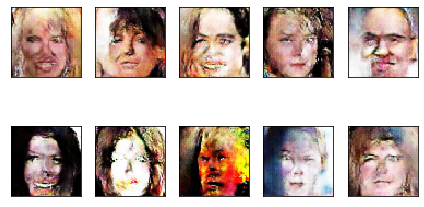

Epoch: 256,  Loss: D_real = 0.001, D_fake = 0.016,  G = 9.707
Currently on Epoch 257
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 257,  Loss: D_real = 0.002, D_fake = 0.022,  G = 11.829
Currently on Epoch 258
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 258,  Loss: D_real = 0.011, D_fake = 0.006,  G = 10.129
Currently on Epoch 259
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 259,  Loss: D_real = 0.163, D_fake = 0.000,  G = 15.984
Currently on Epoch 260
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 260,  Loss: D_real = 0.001, D_fake = 0.001,  G = 1

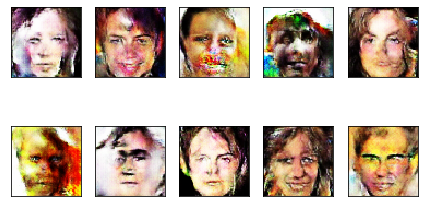

Epoch: 261,  Loss: D_real = 0.014, D_fake = 0.026,  G = 9.195
Currently on Epoch 262
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 262,  Loss: D_real = 0.009, D_fake = 0.024,  G = 9.950
Currently on Epoch 263
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 263,  Loss: D_real = 0.038, D_fake = 0.002,  G = 10.846
Currently on Epoch 264
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 264,  Loss: D_real = 0.004, D_fake = 0.006,  G = 10.523
Currently on Epoch 265
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 265,  Loss: D_real = 0.070, D_fake = 0.071,  G = 8.

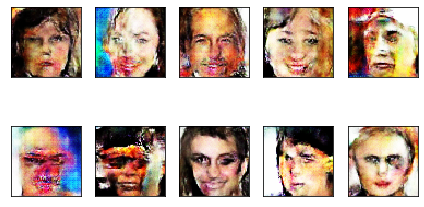

Epoch: 266,  Loss: D_real = 0.426, D_fake = 0.000,  G = 13.168
Currently on Epoch 267
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 267,  Loss: D_real = 0.319, D_fake = 0.001,  G = 18.160
Currently on Epoch 268
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 268,  Loss: D_real = 0.004, D_fake = 0.028,  G = 11.479
Currently on Epoch 269
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 269,  Loss: D_real = 0.003, D_fake = 0.081,  G = 12.114
Currently on Epoch 270
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 270,  Loss: D_real = 0.097, D_fake = 0.001,  G = 

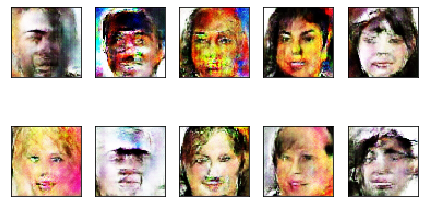

Epoch: 271,  Loss: D_real = 0.020, D_fake = 0.027,  G = 10.735
Currently on Epoch 272
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 272,  Loss: D_real = 0.054, D_fake = 0.005,  G = 10.662
Currently on Epoch 273
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 273,  Loss: D_real = 0.007, D_fake = 0.011,  G = 12.254
Currently on Epoch 274
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 274,  Loss: D_real = 0.001, D_fake = 0.049,  G = 9.169
Currently on Epoch 275
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 275,  Loss: D_real = 0.010, D_fake = 0.018,  G = 1

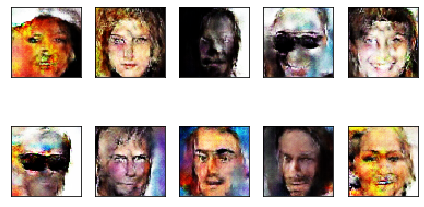

Epoch: 276,  Loss: D_real = 0.003, D_fake = 0.017,  G = 8.039
Currently on Epoch 277
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 277,  Loss: D_real = 0.001, D_fake = 0.041,  G = 8.444
Currently on Epoch 278
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 278,  Loss: D_real = 0.004, D_fake = 0.192,  G = 11.518
Currently on Epoch 279
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 279,  Loss: D_real = 0.008, D_fake = 0.007,  G = 8.126
Currently on Epoch 280
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 280,  Loss: D_real = 0.026, D_fake = 0.004,  G = 14.

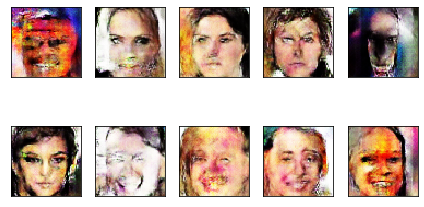

Epoch: 281,  Loss: D_real = 0.000, D_fake = 0.068,  G = 7.009
Currently on Epoch 282
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 282,  Loss: D_real = 0.029, D_fake = 0.011,  G = 10.208
Currently on Epoch 283
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 283,  Loss: D_real = 0.102, D_fake = 0.001,  G = 12.882
Currently on Epoch 284
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 284,  Loss: D_real = 0.035, D_fake = 0.007,  G = 12.613
Currently on Epoch 285
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 285,  Loss: D_real = 0.015, D_fake = 0.099,  G = 9

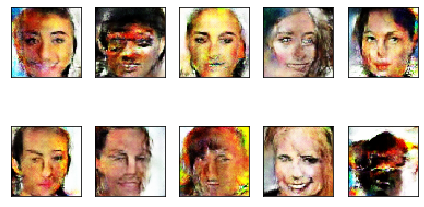

Epoch: 286,  Loss: D_real = 0.036, D_fake = 0.021,  G = 11.217
Currently on Epoch 287
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 287,  Loss: D_real = 0.001, D_fake = 0.028,  G = 7.227
Currently on Epoch 288
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 288,  Loss: D_real = 0.018, D_fake = 0.018,  G = 9.267
Currently on Epoch 289
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 289,  Loss: D_real = 0.014, D_fake = 0.026,  G = 7.097
Currently on Epoch 290
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 290,  Loss: D_real = 0.018, D_fake = 0.116,  G = 9.3

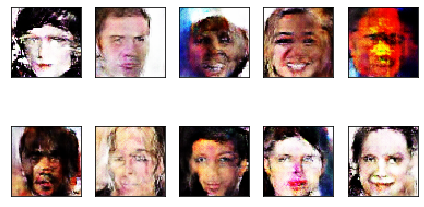

Epoch: 291,  Loss: D_real = 0.008, D_fake = 0.052,  G = 8.942
Currently on Epoch 292
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 292,  Loss: D_real = 0.092, D_fake = 0.001,  G = 10.015
Currently on Epoch 293
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 293,  Loss: D_real = 0.006, D_fake = 0.006,  G = 10.450
Currently on Epoch 294
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 294,  Loss: D_real = 0.022, D_fake = 0.015,  G = 10.117
Currently on Epoch 295
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 295,  Loss: D_real = 0.002, D_fake = 0.026,  G = 9

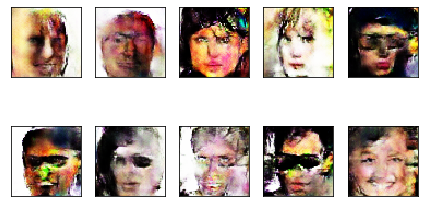

Epoch: 296,  Loss: D_real = 0.006, D_fake = 0.021,  G = 9.559
Currently on Epoch 297
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 297,  Loss: D_real = 0.046, D_fake = 0.005,  G = 13.806
Currently on Epoch 298
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 298,  Loss: D_real = 0.012, D_fake = 0.045,  G = 8.421
Currently on Epoch 299
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 299,  Loss: D_real = 0.018, D_fake = 0.011,  G = 10.517
Currently on Epoch 300
	Currently on batch number 0 of 390
	Currently on batch number 100 of 390
	Currently on batch number 200 of 390
	Currently on batch number 300 of 390
Epoch: 300,  Loss: D_real = 0.043, D_fake = 0.042,  G = 9.

In [ ]:
with tf.device('/gpu:0'):
 for epoch in range(epochs):
    print(f"Currently on Epoch {epoch+1}")
    
    # For every batch in the dataset
    for i in range(X_train.shape[0]//batch_size):
        
        if (i)%100 == 0:
            print(f"\tCurrently on batch number {i} of {len(X_train)//batch_size}")
            
        noise=np.random.uniform(-1,1,size=[batch_size,noise_shape])
        
        gen_image = generator.predict_on_batch(noise)
        
        train_dataset = X_train[i*batch_size:(i+1)*batch_size]
        #train on real image
        train_label=np.ones(shape=(batch_size,1))
        discriminator.trainable = True
        d_loss1 = discriminator.train_on_batch(train_dataset,train_label)
        
        #train on fake image
        train_label=np.zeros(shape=(batch_size,1))
        d_loss2 = discriminator.train_on_batch(gen_image,train_label)
        
        
        noise=np.random.uniform(-1,1,size=[batch_size,noise_shape])
        train_label=np.ones(shape=(batch_size,1))
        discriminator.trainable = False
        #train the generator
        g_loss = GAN.train_on_batch(noise, train_label)
        D_loss.append(d_loss1+d_loss2)
        G_loss.append(g_loss)
        
         
    if epoch % 5 == 0:
        samples = 10
        x_fake = generator.predict(np.random.normal(loc=0, scale=1, size=(samples,100)))

        for k in range(samples):
            plt.subplot(2, 5, k+1)
            plt.imshow(x_fake[k].reshape(64,64,3))
            plt.xticks([])
            plt.yticks([])

        
        plt.tight_layout()
        plt.show()
    print('Epoch: %d,  Loss: D_real = %.3f, D_fake = %.3f,  G = %.3f' %   (epoch+1, d_loss1, d_loss2, g_loss))        
print('Training is complete')

approx training time for 300 epochs was somthing little more than 2 hours.

# **Output Visualization**

In [ ]:
noise=np.random.uniform(-1,1,size=[500,noise_shape])

In [ ]:
im=generator.predict(noise)

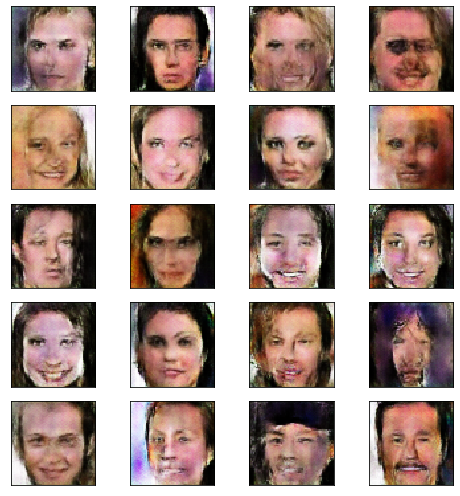

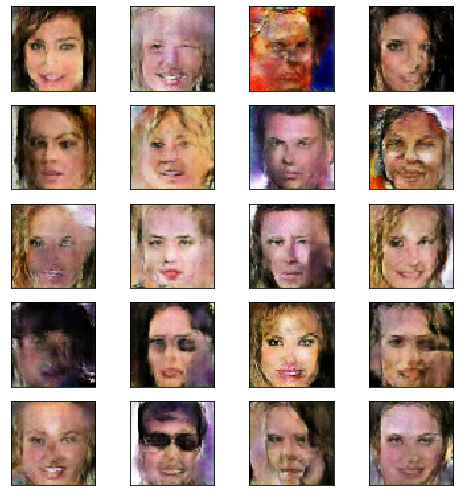

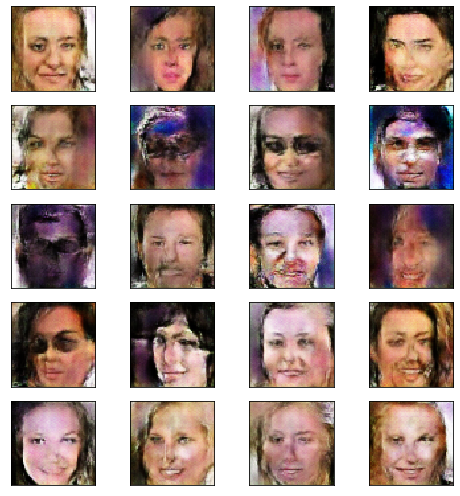

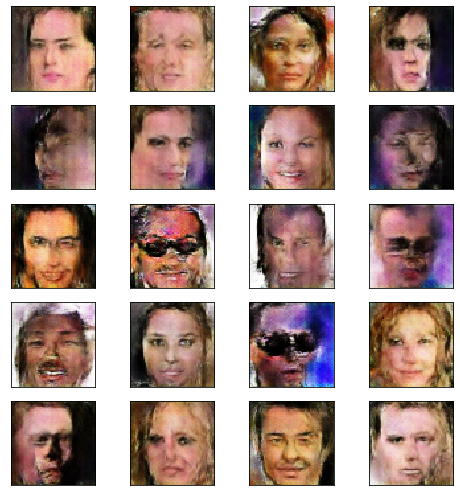

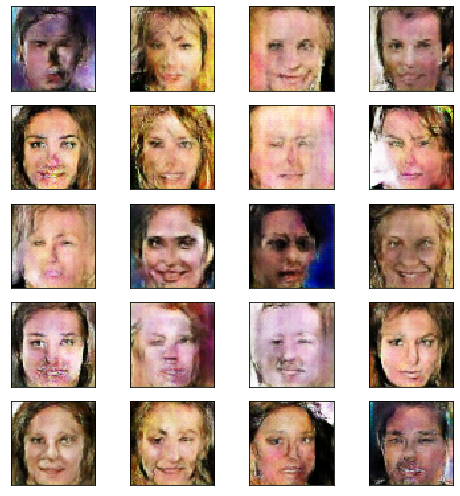

In [ ]:
for i in range(5):
 plt.figure(figsize=(7,7))   
 for k in range(20):
            noise=np.random.uniform(-1,1,size=[100,noise_shape])
            im=generator.predict(noise) 
            plt.subplot(5, 4, k+1)
            plt.imshow(im[k].reshape(64,64,3))
            plt.xticks([])
            plt.yticks([])
 
 plt.tight_layout()
 plt.show()

# **Loss Curve**

/opt/conda/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


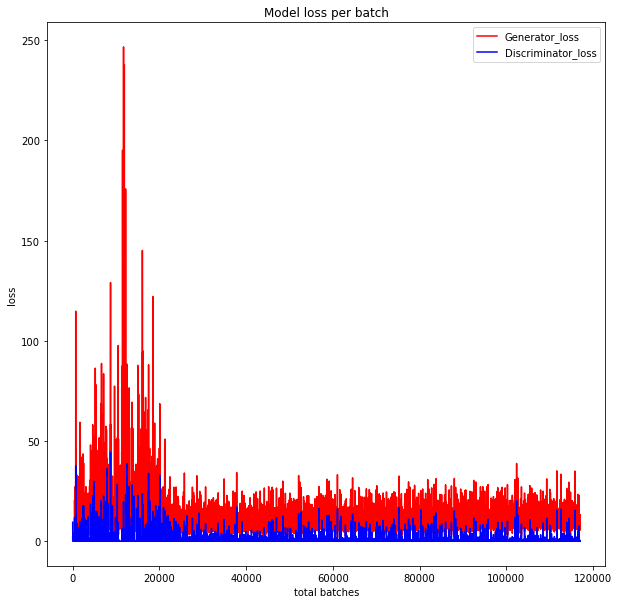

In [ ]:
plt.figure(figsize=(10,10))
plt.plot(G_loss,color='red',label='Generator_loss')
plt.plot(D_loss,color='blue',label='Discriminator_loss')
plt.legend()
plt.xlabel('total batches')
plt.ylabel('loss')
plt.title('Model loss per batch')
plt.show()